In [0]:
products_df = spark.read.format("csv").option("header", "true").load
("dbfs:/FileStore/shared_uploads/athimoolam.k@northeastern.edu/amazon_products_raw.csv")
categories_df = spark.read.format("csv").option("header", "true").load
("dbfs:/FileStore/shared_uploads/athimoolam.k@northeastern.edu/amazon_categories_raw.csv")

In [0]:
products_df.write.format("delta").mode("overwrite").save("/delta/amazon_products")
categories_df.write.format("delta").mode("overwrite").save("/delta/amazon_categories")

In [0]:
%sql
CREATE TABLE amazon_products USING DELTA LOCATION '/delta/amazon_products/';
CREATE TABLE amazon_categories USING DELTA LOCATION '/delta/amazon_categories/';


In [0]:
%sql
SELECT * FROM amazon_products;

asin,title,imgUrl,productURL,stars,reviews,price,listPrice,category_id,isBestSeller,boughtInLastMonth
B014TMV5YE,"Sion Softside Expandable Roller Luggage, Black, Checked-Large 29-Inch",https://m.media-amazon.com/images/I/815dLQKYIYL._AC_UL320_.jpg,https://www.amazon.com/dp/B014TMV5YE,4.5,0,139.99,0.0,104,False,2000
B07GDLCQXV,Luggage Sets Expandable PC+ABS Durable Suitcase Double Wheels TSA Lock Blue,https://m.media-amazon.com/images/I/81bQlm7vf6L._AC_UL320_.jpg,https://www.amazon.com/dp/B07GDLCQXV,4.5,0,169.99,209.99,104,False,1000
B07XSCCZYG,"Platinum Elite Softside Expandable Checked Luggage, 8 Wheel Spinner Suitcase, TSA Lock, Men and Women, True Navy Blue, Checked Medium 25-Inch",https://m.media-amazon.com/images/I/71EA35zvJBL._AC_UL320_.jpg,https://www.amazon.com/dp/B07XSCCZYG,4.6,0,365.49,429.99,104,False,300
B08MVFKGJM,"Freeform Hardside Expandable with Double Spinner Wheels, Navy, 2-Piece Set (21/28)",https://m.media-amazon.com/images/I/91k6NYLQyIL._AC_UL320_.jpg,https://www.amazon.com/dp/B08MVFKGJM,4.6,0,291.59,354.37,104,False,400
B01DJLKZBA,"Winfield 2 Hardside Expandable Luggage with Spinner Wheels, Checked-Large 28-Inch, Deep Blue",https://m.media-amazon.com/images/I/61NJoaZcP9L._AC_UL320_.jpg,https://www.amazon.com/dp/B01DJLKZBA,4.5,0,174.99,309.99,104,False,400
B07XSCD2R4,"Maxlite 5 Softside Expandable Luggage with 4 Spinner Wheels, Lightweight Suitcase, Men and Women, Sapphire Blue, Carry-On 21-Inch",https://m.media-amazon.com/images/I/61LnBNsSBSL._AC_UL320_.jpg,https://www.amazon.com/dp/B07XSCD2R4,4.5,0,144.49,0.0,104,False,500
B07MXF4G8K,"Hard Shell Carry on Luggage Airline Approved, Carry on Suitcases with Wheels, Lightweight PC Luminous Textured Travel Luggage, TSA Approved, 20 Inch Small Carry-On, Black",https://m.media-amazon.com/images/I/71CghLYrnAL._AC_UL320_.jpg,https://www.amazon.com/dp/B07MXF4G8K,4.5,0,169.99,0.0,104,False,400
B07H515VCZ,"""Maxporter II 30"""" Hardside Spinner Trunk Luggage",Expandable,"Navy""",https://m.media-amazon.com/images/I/81f3h+YHOXL._AC_UL320_.jpg,https://www.amazon.com/dp/B07H515VCZ,4.5,0,299.99,0.0,104
B08BXBCNMQ,"Omni 2 Hardside Expandable Luggage with Spinner Wheels, Checked-Large 28-Inch, Arctic Silver",https://m.media-amazon.com/images/I/91eOWP4mySL._AC_UL320_.jpg,https://www.amazon.com/dp/B08BXBCNMQ,4.5,0,112.63,137.04,104,False,500
B0B9K44XTS,Luggage Sets Expandable Lightweight Suitcases with Wheels PC+ABS Durable Travel Luggage TSA Lock Navy Blue 4pcs,https://m.media-amazon.com/images/I/81dsv5GrCLL._AC_UL320_.jpg,https://www.amazon.com/dp/B0B9K44XTS,4.4,0,209.99,0.0,104,False,200


In [0]:
%sql
SELECT * FROM amazon_categories;

id,category_name
1,Beading & Jewelry Making
2,Fabric Decorating
3,Knitting & Crochet Supplies
4,Printmaking Supplies
5,Scrapbooking & Stamping Supplies
6,Sewing Products
7,Craft & Hobby Fabric
8,Needlework Supplies
9,"Arts, Crafts & Sewing Storage"
10,"Painting, Drawing & Art Supplies"


In [0]:
%sql
select count(*) as amazon_products from amazon_products;

amazon_products
1426337


In [0]:
%sql
select count(*) as amazon_categories from amazon_categories;

amazon_categories
248


In [0]:
%sql
select count(*) from amazon_products where category_id is null;

count(1)
98


In [0]:
%sql
select count(*) from (select p.*, c.category_name as category_name 
from amazon_products p left join amazon_categories c 
on p.category_id = c.id where c.category_name is null)

count(1)
52847


In [0]:
%sql
select * from (select p.category_id, c.category_name as category_name 
from amazon_products p left join amazon_categories c 
on p.category_id = c.id where c.category_name is null)

category_id,category_name
0.0,null
0.0,null
12.99,null
0.0,null
4.4,null
0.0,null
0.0,null
0.0,null
0,null
0,null


In [0]:
%sql
create or replace table amazon_data 
(select p.asin, p.title, cast(p.category_id as bigint), c.category_name as category_name,
cast(p.listPrice as double), cast(p.price as double), cast(p.isBestSeller as boolean),
cast(p.stars as float), cast(p.reviews as bigint),
cast(p.boughtInLastMonth as bigint)
from amazon_products p left join amazon_categories c 
on p.category_id = c.id where !(category_id is null or category_name is null));

num_affected_rows,num_inserted_rows


In [0]:
%sql
select * from amazon_data;

asin,title,category_id,category_name,listPrice,price,isBestSeller,stars,reviews,boughtInLastMonth
B014TMV5YE,"Sion Softside Expandable Roller Luggage, Black, Checked-Large 29-Inch",104,Suitcases,0.0,139.99,false,4.5,0,2000
B07GDLCQXV,Luggage Sets Expandable PC+ABS Durable Suitcase Double Wheels TSA Lock Blue,104,Suitcases,209.99,169.99,false,4.5,0,1000
B07XSCCZYG,"Platinum Elite Softside Expandable Checked Luggage, 8 Wheel Spinner Suitcase, TSA Lock, Men and Women, True Navy Blue, Checked Medium 25-Inch",104,Suitcases,429.99,365.49,false,4.6,0,300
B08MVFKGJM,"Freeform Hardside Expandable with Double Spinner Wheels, Navy, 2-Piece Set (21/28)",104,Suitcases,354.37,291.59,false,4.6,0,400
B01DJLKZBA,"Winfield 2 Hardside Expandable Luggage with Spinner Wheels, Checked-Large 28-Inch, Deep Blue",104,Suitcases,309.99,174.99,false,4.5,0,400
B07XSCD2R4,"Maxlite 5 Softside Expandable Luggage with 4 Spinner Wheels, Lightweight Suitcase, Men and Women, Sapphire Blue, Carry-On 21-Inch",104,Suitcases,0.0,144.49,false,4.5,0,500
B07MXF4G8K,"Hard Shell Carry on Luggage Airline Approved, Carry on Suitcases with Wheels, Lightweight PC Luminous Textured Travel Luggage, TSA Approved, 20 Inch Small Carry-On, Black",104,Suitcases,0.0,169.99,false,4.5,0,400
B08BXBCNMQ,"Omni 2 Hardside Expandable Luggage with Spinner Wheels, Checked-Large 28-Inch, Arctic Silver",104,Suitcases,137.04,112.63,false,4.5,0,500
B0B9K44XTS,Luggage Sets Expandable Lightweight Suitcases with Wheels PC+ABS Durable Travel Luggage TSA Lock Navy Blue 4pcs,104,Suitcases,0.0,209.99,false,4.4,0,200
B07QZLHTTY,"Crew Versapack Softside Expandable 8 Spinner Wheel Luggage, USB Port, Men and Women, Patriot Blue, Checked Medium 25-Inch",104,Suitcases,319.99,271.99,false,4.7,0,100


In [0]:
amazon_df = spark.sql('select * from amazon_data')
amazon_df.show()
amazon_df.printSchema()

+----------+--------------------+-----------+-------------+---------+------+------------+-----+-------+-----------------+
|      asin|               title|category_id|category_name|listPrice| price|isBestSeller|stars|reviews|boughtInLastMonth|
+----------+--------------------+-----------+-------------+---------+------+------------+-----+-------+-----------------+
|B014TMV5YE|Sion Softside Exp...|        104|    Suitcases|      0.0|139.99|       false|  4.5|      0|             2000|
|B07GDLCQXV|Luggage Sets Expa...|        104|    Suitcases|   209.99|169.99|       false|  4.5|      0|             1000|
|B07XSCCZYG|Platinum Elite So...|        104|    Suitcases|   429.99|365.49|       false|  4.6|      0|              300|
|B08MVFKGJM|Freeform Hardside...|        104|    Suitcases|   354.37|291.59|       false|  4.6|      0|              400|
|B01DJLKZBA|Winfield 2 Hardsi...|        104|    Suitcases|   309.99|174.99|       false|  4.5|      0|              400|
|B07XSCD2R4|Maxlite 5 So

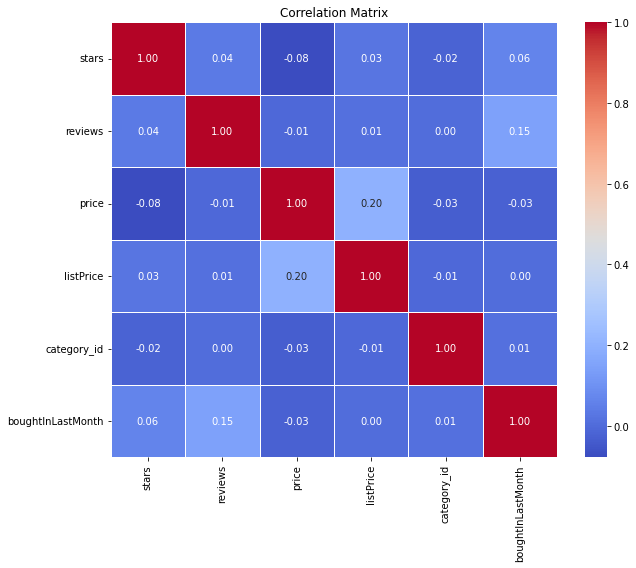

In [0]:
# Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting specific numerical columns for correlation
numerical_columns = ['stars', 'reviews', 'price', 'listPrice', 'category_id', 'boughtInLastMonth']
selected_data = amazon_df.select(*numerical_columns)

# Creating the correlation matrix
correlation_matrix = selected_data.toPandas().corr()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title("Correlation Matrix")
plt.show()


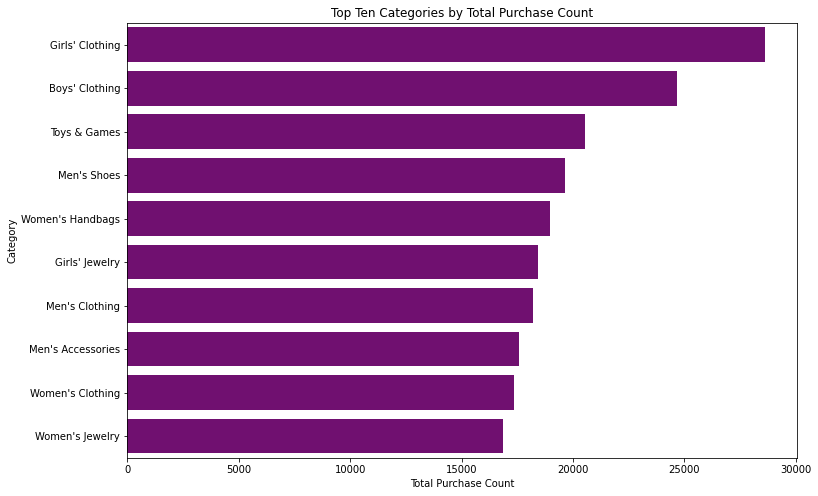

In [0]:
# Calculate the total count of purchases for each category
count_purchase_by_category = amazon_df.groupBy('category_name').agg({'boughtInLastMonth': 'count'}).toPandas()

# Select the top ten categories
top_ten_categories = count_purchase_by_category.sort_values(by='count(boughtInLastMonth)', ascending=False).head(10)

# Create a horizontal bar graph for the top ten categories
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='count(boughtInLastMonth)', y='category_name', data=top_ten_categories, color='purple')
plt.xlabel('Total Purchase Count')
plt.ylabel('Category')
plt.title('Top Ten Categories by Total Purchase Count')

plt.show()

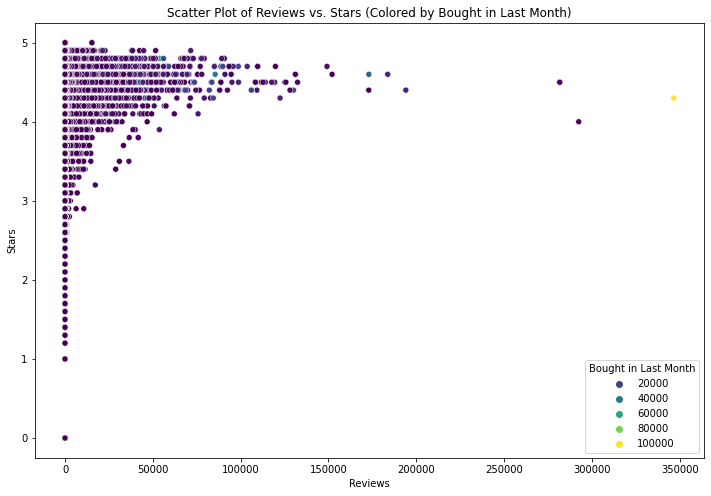

In [0]:
# Convert Spark DataFrame to Pandas DataFrame for plotting
amazon_pd = amazon_df.toPandas()

# Filter out rows where 'boughtInLastMonth' is zero
amazon_pd_filtered = amazon_pd[amazon_pd['boughtInLastMonth'] != 0]

# Scatter plot of reviews vs. stars colored by 'boughtInLastMonth'
plt.figure(figsize=(12, 8))
sns.scatterplot(x='reviews', y='stars', data=amazon_pd_filtered, hue='boughtInLastMonth', palette='viridis')
plt.title('Scatter Plot of Reviews vs. Stars (Colored by Bought in Last Month)')
plt.xlabel('Reviews')
plt.ylabel('Stars')
plt.legend(title='Bought in Last Month')
plt.show()


In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import LogisticRegression

<Figure size 864x576 with 0 Axes>

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
File <command-2718122786198214>:3
      1 # Scatter plot of reviews vs. stars for 
      2 plt.figure(figsize=(12, 8))
----> 3 sns.scatterplot(x='reviews', y='stars', data=amazon_pd, hue='isbes', palette='viridis')
      4 plt.title('Scatter Plot of Reviews vs. Stars (Colored by Bought in Last Month)')
      5 plt.xlabel('Reviews')

File /databricks/python/lib/python3.9/site-packages/seaborn/_decorators.py:46, in _deprecate_positional_args.<locals>.inner_f(*args, **kwargs)
     36     warnings.warn(
     37         "Pass the following variable{} as {}keyword arg{}: {}. "
     38         "From version 0.12, the only valid positional argument "
   (...)
     43         FutureWarning
     44     )
     45 kwargs.update({k: arg for k, arg in zip(sig.parameters, args)})
---> 46 return f(**kwargs)

File /databricks/python/lib/python3.9/site-p

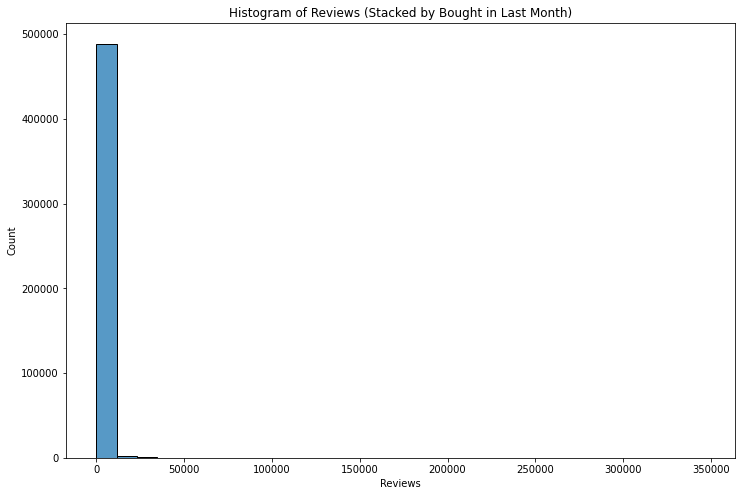

In [0]:
%sql
select count(*) from (select a.asin, a.title, a.category_id, c.category_name as category_name, a.listPrice, a.price, a.isBestSeller, a.stars, a.reviews, a.boughtInLastMonth from amazon a left join category c on a.category_id = c.id where !(a.asin is null or a.title is null or a.category_id is null or c.category_name is null or a.listPrice is null or a.price is null or a.isBestSeller is null or a.stars is null or a.reviews is null or a.boughtInLastMonth is null)) as cnt

count(1)
1373490


In [0]:
%sql
select count(*) from(select a.asin, a.title, a.category_id, c.category_name as category_name, a.listPrice, a.price, a.isBestSeller, a.stars, a.reviews, a.boughtInLastMonth from amazon a left join category c on a.category_id = c.id where a.category_id is not null) nt

count(1)
1426239


In [0]:
%sql
create or replace table amazon_temp (select a.asin, a.title, a.category_id, c.category_name as category_name, a.listPrice, a.price, a.isBestSeller, a.stars, a.reviews, a.boughtInLastMonth from amazon a left join category c on a.category_id = c.id);

num_affected_rows,num_inserted_rows


In [0]:
%sql
select * from amazon_temp where category_id is null

asin,title,category_id,category_name,listPrice,price,isBestSeller,stars,reviews,boughtInLastMonth
B09T919LNV,"""Nails Flat & Concrete Assortment Kit 420pc, 1"""" to 2-1/2""""",null,null,null,null,null,",https://m.media-amazon.com/images/I/71JdZG55ylL._AC_UL320_.jpg,https://www.amazon.com/dp/B09T919LNV,4.7,0,17.99,0.0,154,False,100",null,null
B098BF68BX,"""Yarn Bowl, Wooden Yarn Bowl for Crochet, Knitting Yarn Bowl with Holes Storage Handmade to Prevent Slipping, Mother's Day Gift, Christmas Day, Antique Brown Color Size - 6"""" Dia x 4.5"""" H",null,null,null,null,null,null,null,null
B09KMNR2DL,"""xo, Fetti Disco Ball Foil Balloons - 4 pk, 22"""" | Bachelorette Party Decorations",null,null,null,null,null,",https://m.media-amazon.com/images/I/71kyiujLiJL._AC_UL320_.jpg,https://www.amazon.com/dp/B09KMNR2DL,4.7,0,11.99,0.0,13,False,400",null,null
B014JNFOWW,"""Bung Cap 2"""" with 3/4"""" Knock Out Combo 2pc (1 Buttress Thread & 1 NPT Thread) Fits Plastic 15",null,null,null,null,null,",https://m.media-amazon.com/images/I/51+oVTOa-KL._AC_UL320_.jpg,https://www.amazon.com/dp/B014JNFOWW,4.5,0,11.52,0.0,144,False,100",null,null
B0C9ZQRJBJ,"""AYMMIC 5/16""""-3/8"""" Chain Binder and 5/16""""x20FT Transport Chain Kit",null,null,null,null,null,null,null,null
B089SLVZC9,"""Spec Ops Tools 25-Foot Tape Measure, 1 1/4"""" Double-Sided Blade",null,null,null,null,null,",https://m.media-amazon.com/images/I/519QrWOnYfL._AC_UL320_.jpg,https://www.amazon.com/dp/B089SLVZC9,4.5,0,14.39,0.0,150,False,1000",null,null
B00DT3T632,"""Komelon EV28116; 16' X 1"""" Self Lock Evolution Tape Measure",null,null,null,null,null,null,null,null
B0BPP2M2XC,"""Rubber Edge Trim, Self-Adhesive Rubber Edge Trim, Edge Protector for Sheet Metal, EPDM Material, Fit 1/16""""(1.6mm)",null,null,null,null,null,",https://m.media-amazon.com/images/I/41KvOWac6TL._AC_UL320_.jpg,https://www.amazon.com/dp/B0BPP2M2XC,4.6,0,18.99,19.99,212,False,0",null,null
B00004T7DH,"""Freud 18-112: 3/8"""" Radius Round Nose Bit",null,null,null,null,null,",https://m.media-amazon.com/images/I/61eS5-nrF1S._AC_UL320_.jpg,https://www.amazon.com/dp/B00004T7DH,4.8,0,26.99,0.0,153,False,50",null,null
B09Y5J3M6D,"""QWORK Pin Punches 1/32"""" & 1/16"""" Nail Set",null,null,null,null,null,3500 PSI Strike Force Door Pin Removal Tool,",https://m.media-amazon.com/images/I/61Oh0HIJRkL._AC_UL320_.jpg,https://www.amazon.com/dp/B09Y5J3M6D,4.8,0,9.97,10.95,153,False,0",null


In [0]:
%sql
delete from amazon_temp where category_id is null

num_affected_rows
98


In [0]:
%sql
select count(*) from amazon_temp where category_name is null and category_id in (select id from category);

count(1)
0


In [0]:
%sql
delete from amazon_temp where category_name is null;

num_affected_rows
52749


In [0]:
%sql
select count(*) from amazon_temp;

count(1)
1373490


In [0]:
%sql
select * from amazon_temp where price =0.0 and listPrice >0;

-- a.title, a.category_id, c.category_name as category_name, a.listPrice, a.price, a.isBestSeller, a.stars, a.reviews, a.boughtInLastMonth 

asin,title,category_id,category_name,listPrice,price,isBestSeller,stars,reviews,boughtInLastMonth
B0032COUMC,Drive: The Surprising Truth About What Motivates Us,55,Data Storage,12.99,0.0,False,4.5,0,0
B07957BM64,"Manipulation: How to Secretly Manipulate People: Discover How to Manipulate, Persuade, and Influence Anyone, Taking Advantage of Human Psychology",55,Data Storage,6.95,0.0,False,4.0,0,0
B002LTZYN6,Beach Music: A Novel,74,eBook Readers & Accessories,29.25,0.0,False,4.5,0,0
B08WF3PWMS,"As Good as Dead: The Finale to a Good Girl's Guide to Murder (A Good Girl's Guide to Murder, Book 3)",74,eBook Readers & Accessories,24.75,0.0,False,4.5,0,0
B007UWPAD8,Fifty Shades Freed: Book Three of the Fifty Shades Trilogy,74,eBook Readers & Accessories,19.92,0.0,False,4.5,0,0
B082FRDSM4,The Girl with the Louding Voice: A Novel,74,eBook Readers & Accessories,17.92,0.0,False,4.6,0,0
B08B39CZX3,Assassins of Athens,74,eBook Readers & Accessories,18.99,0.0,False,4.1,0,0
B09MV827NK,Babel: Or the Necessity of Violence: An Arcane History of the Oxford Translators' Revolution,74,eBook Readers & Accessories,40.49,0.0,False,4.4,0,0
B000Z7FH38,The Fountainhead,74,eBook Readers & Accessories,27.37,0.0,False,4.6,0,0
B086VRVPTP,Strange but True,74,eBook Readers & Accessories,18.26,0.0,False,4.1,0,0


In [0]:
%python
